In [1]:
import sys
import numpy as np
import time
import sys, os
# os.environ["CUDA_VISIBLE_DEVICES"]="0"

import random
import gc
import scipy.ndimage as ndimage
from skimage.transform import resize
import matplotlib.pyplot as plt

from deepmass import map_functions as mf
from deepmass import lens_data as ld
from deepmass import wiener
from deepmass import cnn_keras as cnn

plt.rcParams['image.cmap'] = 'coolwarm'


In [2]:
import numpy as np
import tensorflow.keras as keras
from tensorflow.keras.layers import Input, Dropout, Conv2D, MaxPooling2D, UpSampling2D, add, BatchNormalization, Conv2DTranspose
from tensorflow.keras.layers import concatenate, AveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.optimizers import Adam


class UnetlikeBaseline_new:
    """
    A CNN class that creates a denoising Unet
    """

    def __init__(self, map_size, learning_rate, channels=[1,1], dropout_val=None):
        """
        Initialisation
        :param map_size: size of square image (there are map_size**2 pixels)
        :param learning_rate: learning rate for the optimizer
        """
        self.map_size = map_size
        self.learning_rate = learning_rate
        self.dropout_val = dropout_val
        self.channels = channels

        if dropout_val is not None:
            print('using dropout: ' + str(dropout_val))

    def model(self):
        input_img = Input(shape=(self.map_size, self.map_size, self.channels[0]))

        x1 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(input_img)
        x1 = BatchNormalization()(x1)

        pool1 = AveragePooling2D(pool_size=(2, 2))(x1)
        x2 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
        x2 = BatchNormalization()(x2)

        pool2 = AveragePooling2D(pool_size=(2, 2))(x2)
        x3 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
        x3 = BatchNormalization()(x3)

        pool3 = AveragePooling2D(pool_size=(2, 2))(x3)
        x4 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool3)
        x4 = BatchNormalization()(x4)

        pool_deep = AveragePooling2D(pool_size=(2, 2))(x4)
        xdeep = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool_deep)
        xdeep = BatchNormalization()(xdeep)

        updeep = UpSampling2D((2, 2))(xdeep)
        mergedeep = concatenate([x4, updeep], axis=3)

        xdeep2 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(mergedeep)
        xdeep2 = BatchNormalization()(xdeep2)

        up5 = UpSampling2D((2, 2))(xdeep2)
        merge5 = concatenate([x3, up5], axis=3)
        merge5 = BatchNormalization()(merge5)

        x5 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge5)

        up6 = UpSampling2D((2, 2))(x5)
        merge6 = concatenate([x2, up6], axis=3)
        merge6 = BatchNormalization()(merge6)

        x6 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge6)

        up7 = UpSampling2D((2, 2))(x6)
        merge7 = concatenate([x1, up7], axis=3)
        merge7 = BatchNormalization()(merge7)

        x7 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge7)
        output = Conv2D(self.channels[1], 1, activation='sigmoid')(x7)

        unet = Model(input_img, output)
        unet.summary()

        if self.learning_rate is None:
            unet.compile(optimizer='adam', loss='mse')
        else:
            unet.compile(optimizer=Adam(lr=self.learning_rate), loss='mse')

        return unet

In [3]:
import tensorflow as tf
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]

In [4]:
map_size = 256
n_test = int(1984)
n_epoch = 50
batch_size = 32
learning_rate = 1e-4

# Calculate normalization values (Q,U mean and std)

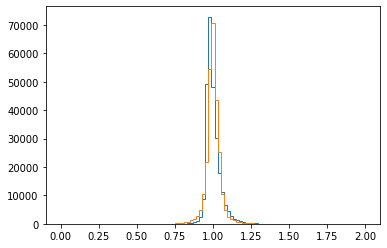

In [5]:
target= np.load('../../polarized_synthesis/data/sim_QiU_stdr_3.npy')
meanQ = np.mean(target.real)
stdQ = np.std(target.real)
meanU = np.mean(target.imag)
stdU = np.std(target.imag)
target = (target.real - meanQ)/(stdQ*20) + 1. + 1j*(target.imag - meanU)/(stdU*20) + 1j

_ = plt.hist(target.real.flatten(), histtype='step', bins=np.linspace(0,2,100))
_ = plt.hist(target.imag.flatten(), histtype='step', bins=np.linspace(0,2,100))

# Load files and normalize

In [6]:
files = [filename for filename in os.listdir('../../polarized_synthesis/long_run/') if '.npy' in filename]
print(files)
nfiles=len(files)
print(nfiles)

['long_run103npy.npy', 'long_run216npy.npy', 'long_run200npy.npy', 'long_run2npy.npy', 'long_run240npy.npy', 'long_run115npy.npy', 'long_run237npy.npy', 'long_run221npy.npy', 'long_run214npy.npy', 'long_run15npy.npy', 'long_run101npy.npy', 'long_run219npy.npy', 'long_run242npy.npy', 'long_run0npy.npy', 'long_run202npy.npy', 'long_run235npy.npy', 'long_run238npy.npy', 'long_run223npy.npy', 'long_run111npy.npy', 'long_run244npy.npy', 'long_run204npy.npy', 'long_run6npy.npy', 'long_run212npy.npy', 'long_run209npy.npy', 'long_run107npy.npy', 'long_run13npy.npy', 'long_run249npy.npy', 'long_run225npy.npy', 'long_run233npy.npy', 'long_run228npy.npy', 'long_run4npy.npy', 'long_run206npy.npy', 'long_run108npy.npy', 'long_run246npy.npy', 'long_run113npy.npy', 'long_run11npy.npy', 'long_run105npy.npy', 'long_run9npy.npy', 'long_run210npy.npy', 'long_run227npy.npy', 'long_run231npy.npy', 'long_run232npy.npy', 'long_run229npy.npy', 'long_run224npy.npy', 'long_run213npy.npy', 'long_run12npy.npy', '

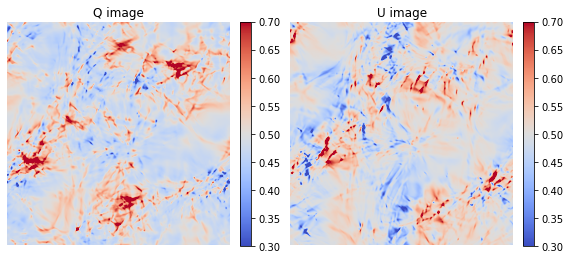

In [7]:
input_foreground_array = np.empty((nfiles,512,512,2))
    
for i in range(nfiles):
    temp_map = np.load('../../polarized_synthesis/long_run/' + files[i])
    input_foreground_array[i,:,:,0] = ndimage.gaussian_filter(temp_map.real, 1)
    input_foreground_array[i,:,:,1] = ndimage.gaussian_filter(temp_map.imag, 1)

meanQ_final = np.mean(input_foreground_array[:,:,:,0])
stdQ_final = np.std(input_foreground_array[:,:,:,0])
meanU_final = np.mean(input_foreground_array[:,:,:,1])
stdU_final = np.std(input_foreground_array[:,:,:,1])
    
input_foreground_array[:,:,:,0] = (input_foreground_array[:,:,:,0] - meanQ_final)/(20*stdQ_final)
input_foreground_array[:,:,:,1] = (input_foreground_array[:,:,:,1] - meanU_final)/(20*stdU_final)
    
for i in range(1):
    _ = plt.figure(figsize=(8,4))
    _ = plt.subplot(1,2,1), plt.imshow(input_foreground_array[i,:,:,0]+0.5,
                                       clim=(0.3,0.7),
                                       interpolation='spline16', cmap = 'coolwarm')
    _ = plt.title('Q image'), plt.colorbar(fraction=0.046, pad=0.04)
    _ = plt.axis('off')
    _ = plt.subplot(1,2,2), plt.imshow(input_foreground_array[i,:,:,1]+0.5,
                                       clim=(0.3,0.7),
                                       interpolation='spline16', cmap = 'coolwarm')
    _ = plt.title('U image'), plt.colorbar(fraction=0.046, pad=0.04)
    _ = plt.axis('off')
    _ = plt.tight_layout(True), plt.show()

# Replicate 3 rotations of original images & then do flip

In [8]:
rotated_foreground_array  = np.vstack([tf.image.rot90(input_foreground_array, k = i) for i in range(4)])
print(rotated_foreground_array.shape)

rotated_foreground_array = np.concatenate([rotated_foreground_array,
                                           tf.image.transpose(rotated_foreground_array)]).astype(np.float32)
gc.collect()

(328, 512, 512, 2)


11032

## Test rotation

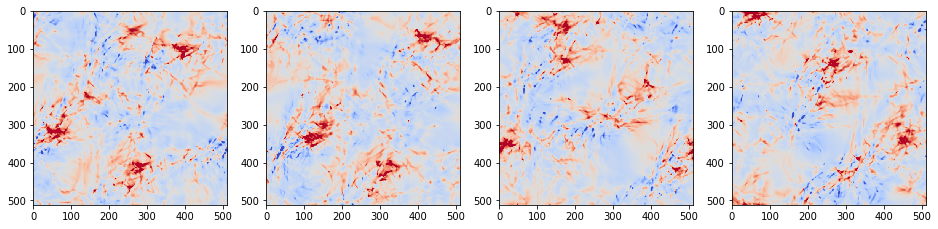

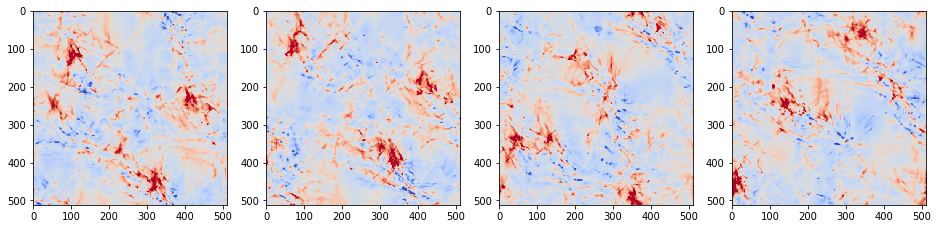

In [9]:
plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1)
    plt.imshow(rotated_foreground_array[i*20,:,:,0]+0.5, clim=(0.3,0.7))
plt.show()

plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1)
    plt.imshow(rotated_foreground_array[i*20+input_foreground_array.shape[0],:,:,0]+0.5, clim=(0.3,0.7))
plt.show()

## Test flip

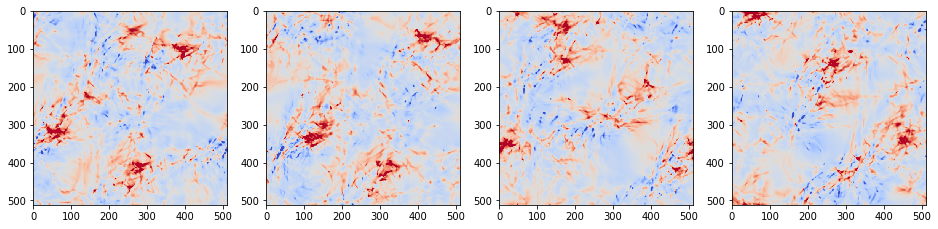

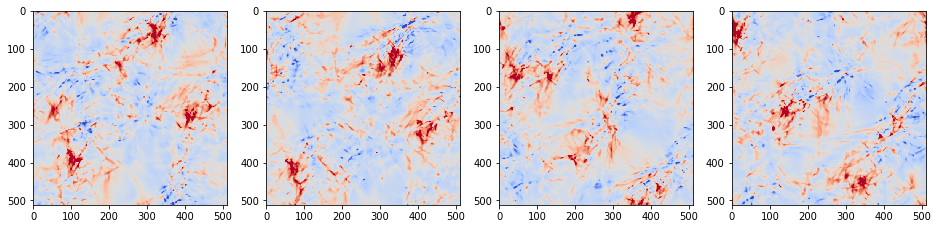

In [10]:
plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1)
    plt.imshow(rotated_foreground_array[i*20,:,:,0]+0.5, clim=(0.3,0.7))
plt.show()

plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1)
    plt.imshow(rotated_foreground_array[i*20+int(0.5*rotated_foreground_array.shape[0]),:,:,0]+0.5,
               clim=(0.3,0.7))
plt.show()

# Stride patches

In [11]:
n_step = 8
grid_step = np.meshgrid(np.linspace(0,map_size*2,n_step+1, dtype=int)[:-1],
                        np.linspace(0,map_size*2,n_step+1, dtype=int)[:-1])
grid_i_index = grid_step[0].flatten()
grid_j_index = grid_step[1].flatten()

noisy_array = np.empty((len(grid_i_index)*rotated_foreground_array.shape[0], map_size,map_size,2), dtype=np.float32)
print(noisy_array.shape)

for i in range(len(grid_i_index)):
    low_lim = i*rotated_foreground_array.shape[0]
    high_lim = (i+1)*rotated_foreground_array.shape[0]
    noisy_array[low_lim:high_lim] = np.roll(np.roll(rotated_foreground_array, shift=grid_i_index[i],axis=1),
                                            shift=grid_j_index[i],axis=2)[:,:int(map_size),:int(map_size),:]


random_indices = np.arange(noisy_array.shape[0])
np.random.shuffle(random_indices)

noisy_array = noisy_array[random_indices]

(41984, 256, 256, 2)


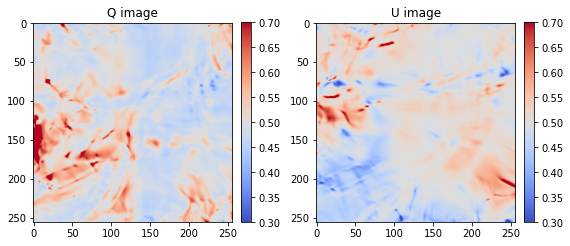

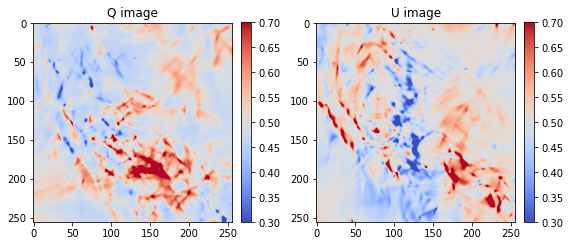

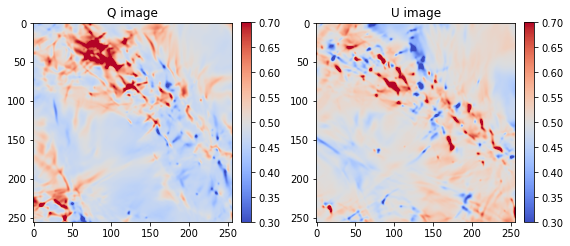

In [12]:
for i in range(3):
    _ = plt.figure(figsize=(8,4))
    _ = plt.subplot(1,2,1), plt.imshow(noisy_array[i,:,:,0]+0.5,
                                       clim=(0.3,0.7),
                                       interpolation='spline16', cmap = 'coolwarm')
    _ = plt.title('Q image'), plt.colorbar(fraction=0.046, pad=0.04)
#     _ = plt.axis('off')
    _ = plt.subplot(1,2,2), plt.imshow(noisy_array[i,:,:,1]+0.5,
                                       clim=(0.3,0.7),
                                       interpolation='spline16', cmap = 'coolwarm')
    _ = plt.title('U image'), plt.colorbar(fraction=0.046, pad=0.04)
#     _ = plt.axis('off')
    _ = plt.tight_layout(True), plt.show()

# Signal

In [13]:
files = sorted(os.listdir('../../polarized_synthesis/data/cmb_signal/maps/'))
full_path_files = [('../../polarized_synthesis/data/cmb_signal/maps/' + file) for file in files if '.npy' in file]
print(len(full_path_files))

n_files = 22000
clean_array = np.stack([np.load(f).transpose(1,2,0) for f in full_path_files[:n_files]])[:,:,:,:2]
gc.collect()

43200


62006

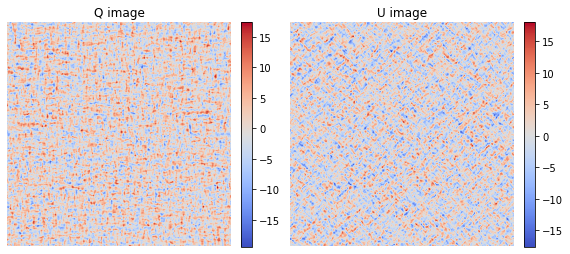

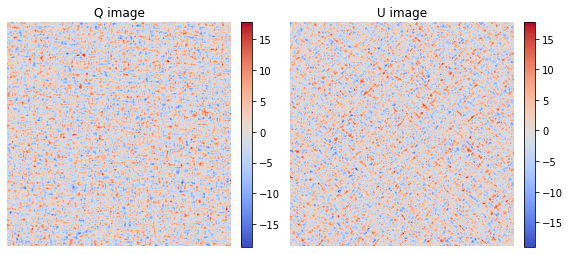

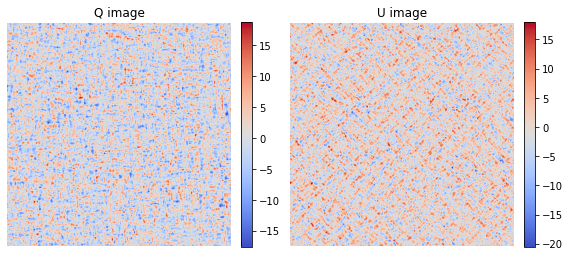

In [14]:
for i in range(3):
    _ = plt.figure(figsize=(8,4))
    _ = plt.subplot(1,2,1), plt.imshow(clean_array[i,:,:,0],
                                       interpolation='spline16', cmap = 'coolwarm')
    _ = plt.title('Q image'), plt.colorbar(fraction=0.046, pad=0.04)
    _ = plt.axis('off')
    _ = plt.subplot(1,2,2), plt.imshow(clean_array[i,:,:,1],
                                       interpolation='spline16', cmap = 'coolwarm')
    _ = plt.title('U image'), plt.colorbar(fraction=0.046, pad=0.04)
    _ = plt.axis('off')
    _ = plt.tight_layout(True), plt.show()

# Generate data

In [15]:
for i in range(clean_array.shape[0]):
    if i%(int(clean_array.shape[0]/50))==0: print(i, flush=True)
    clean_array[i,:,:,0] = ndimage.gaussian_filter(clean_array[i,:,:,0], 1)
    clean_array[i,:,:,0] = (clean_array[i,:,:,0] - np.mean(clean_array[i,:,:,0]))*np.random.normal(1,0.1) + clean_array[i,:,:,0]
gc.collect()

clean_array = (clean_array - np.mean(clean_array))/(30*np.std(clean_array)) + 0.5
noisy_array = noisy_array[:n_files] + clean_array #+ 0.1

test_array_noisy = noisy_array[:n_test]
test_array_clean = clean_array[:n_test]
gc.collect()

noisy_array = noisy_array[n_test:]
clean_array = clean_array[n_test:]
gc.collect()

0
440
880
1320
1760
2200
2640
3080
3520
3960
4400
4840
5280
5720
6160
6600
7040
7480
7920
8360
8800
9240
9680
10120
10560
11000
11440
11880
12320
12760
13200
13640
14080
14520
14960
15400
15840
16280
16720
17160
17600
18040
18480
18920
19360
19800
20240
20680
21120
21560


0

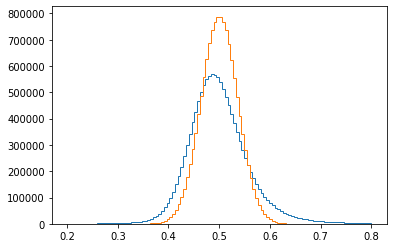

In [16]:
_ = plt.hist(noisy_array[:200,:,:,0].flatten(), bins=np.linspace(0.2,0.8,111), histtype='step')
_ = plt.hist(clean_array[:200,:,:,0].flatten(), bins=np.linspace(0.2,0.8,111), histtype='step')

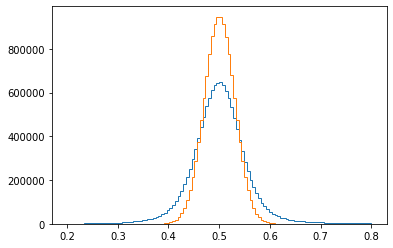

In [17]:
_ = plt.hist(noisy_array[:200,:,:,1].flatten(), bins=np.linspace(0.2,0.8,111), histtype='step')
_ = plt.hist(clean_array[:200,:,:,1].flatten(), bins=np.linspace(0.2,0.8,111), histtype='step')

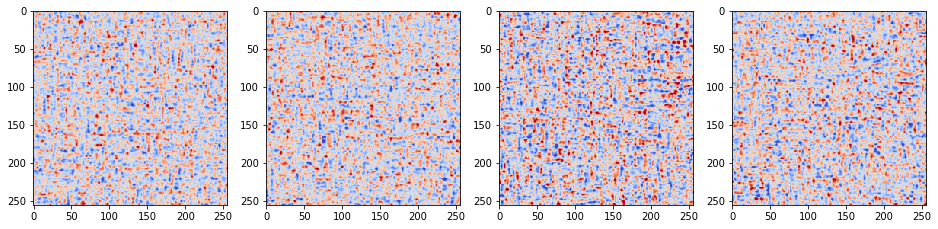

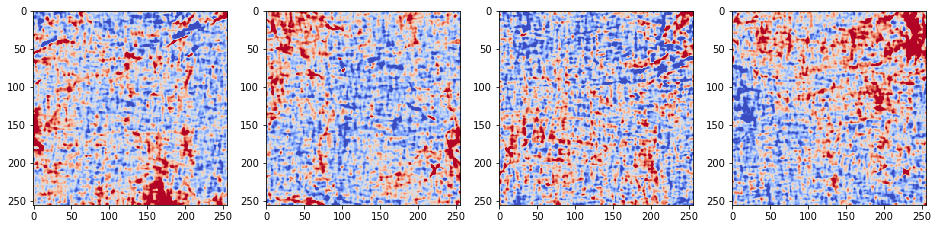

In [18]:
plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(clean_array.real[i*20,:,:,0], clim=(0.4, 0.6))
plt.show()

plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(noisy_array.real[i*20,:,:,0], clim=(0.4,0.6))
plt.show()

# Train

In [19]:
train_gen = cnn.BatchGenerator(noisy_array[:,:,:,0].reshape(list(noisy_array.shape[:3])+[1]),
                               clean_array[:,:,:,0].reshape(list(clean_array.shape[:3])+[1]),
                               gen_batch_size=batch_size)
test_gen = cnn.BatchGenerator(test_array_noisy[:,:,:,0].reshape(list(test_array_noisy.shape[:3])+[1]),
                              test_array_clean[:,:,:,0].reshape(list(test_array_clean.shape[:3])+[1]),
                              gen_batch_size=batch_size)

cnn_instance = UnetlikeBaseline_new(map_size=map_size, learning_rate=learning_rate, channels=[1,1])
cnn_model = cnn_instance.model()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 1) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 16) 160         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 256, 256, 16) 64          conv2d[0][0]                     
__________________________________________________________________________________________________
average_pooling2d (AveragePooli (None, 128, 128, 16) 0           batch_normalization[0][0]        
______________________________________________________________________________________________

In [20]:
# cnn_model_var.save('./models/mean_100_10_1_1')

In [21]:
history = cnn_model.fit_generator(generator=train_gen,
                         epochs=40,
                         steps_per_epoch=np.ceil(noisy_array.shape[0] / int(batch_size)),
                         validation_data=test_gen,
                         validation_steps=np.ceil(test_array_noisy.shape[0] / int(batch_size)), verbose=True)

gc.collect()

Epoch 1/40


/obs/njeffrey/.local/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


626/626 [==============================] - 46s 67ms/step - loss: 0.0100 - val_loss: 6.8021e-04
Epoch 2/40
626/626 [==============================] - 41s 65ms/step - loss: 5.8124e-04 - val_loss: 4.8115e-04
Epoch 3/40
626/626 [==============================] - 41s 66ms/step - loss: 4.4501e-04 - val_loss: 4.0661e-04
Epoch 4/40
626/626 [==============================] - 41s 65ms/step - loss: 3.9134e-04 - val_loss: 3.8059e-04
Epoch 5/40
626/626 [==============================] - 41s 65ms/step - loss: 3.5686e-04 - val_loss: 3.5938e-04
Epoch 6/40
626/626 [==============================] - 41s 65ms/step - loss: 3.3685e-04 - val_loss: 3.3197e-04
Epoch 7/40
626/626 [==============================] - 41s 65ms/step - loss: 3.2283e-04 - val_loss: 3.2436e-04
Epoch 8/40
626/626 [==============================] - 41s 65ms/step - loss: 3.0510e-04 - val_loss: 3.3533e-04
Epoch 9/40
626/626 [==============================] - 41s 65ms/step - loss: 2.9693e-04 - val_loss: 3.2368e-04
Epoch 10/40
626/626 [====

50

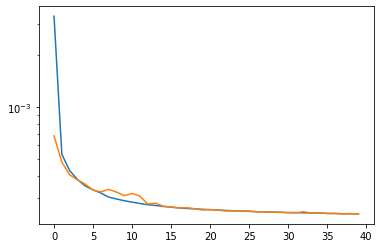

In [22]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.yscale('log')

In [23]:
test_output = cnn_model.predict(test_array_noisy[:5,:,:,0].reshape(5,256,256,1))

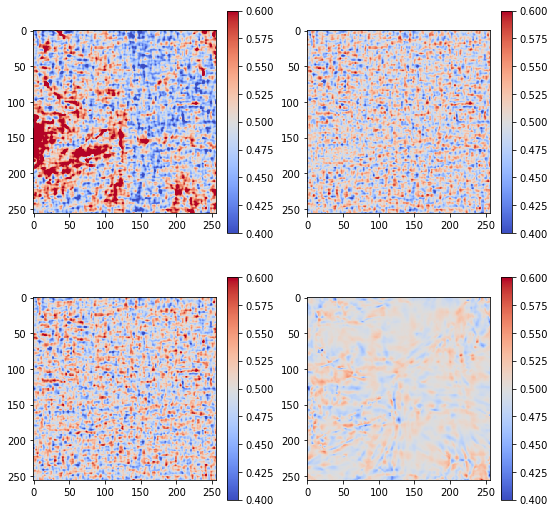

In [24]:
_ = plt.figure(figsize=(9,9))
_ = plt.subplot(221), plt.imshow(test_array_noisy[0,:,:,0], clim=(0.4,0.6)), plt.colorbar()
_ = plt.subplot(222), plt.imshow(test_output[0,:,:,0], clim=(0.4,0.6)), plt.colorbar()
_ = plt.subplot(223), plt.imshow(test_array_clean[0,:,:,0], clim=(0.4,0.6)), plt.colorbar()
_ = plt.subplot(224), plt.imshow((test_array_clean[0,:,:,0]-test_output[0,:,:,0]+0.5), clim=(0.4,0.6))
_ = plt.colorbar()

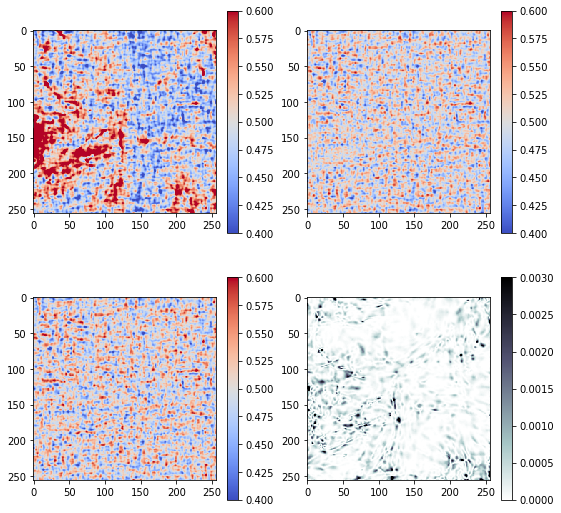

In [25]:
_ = plt.figure(figsize=(9,9))
_ = plt.subplot(221), plt.imshow(test_array_noisy[0,:,:,0], clim=(0.4,0.6)), plt.colorbar()
_ = plt.subplot(222), plt.imshow(test_output[0,:,:,0], clim=(0.4,0.6)), plt.colorbar()
_ = plt.subplot(223), plt.imshow(test_array_clean[0,:,:,0], clim=(0.4,0.6)), plt.colorbar()
_ = plt.subplot(224), plt.imshow((test_array_clean[0,:,:,0]-test_output[0,:,:,0])**2, clim=(0,3e-3), cmap='bone_r')
_ = plt.colorbar()

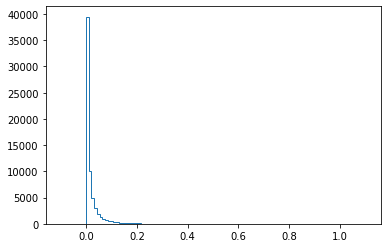

In [26]:
# t = time.time()
# predict_batch = 400
# n_predict_batches = np.ceil(noisy_array.shape[0]/predict_batch).astype(int)
# print(n_predict_batches)
# target_var = np.vstack([cnn_model.predict(noisy_array[i*predict_batch:(i+1)*predict_batch]) 
#                         for i in range(n_predict_batches)])

# print(time.time() - t, flush=True)
# target_var = 100*(target_var - clean_array)**2.

# _ = plt.hist(target_var[0,:,:,0].flatten(),bins=np.linspace(-0.1,1.1,111), histtype='step')

target_var = 100*(cnn_model.predict(np.expand_dims(np.atleast_3d(noisy_array[:,:,:,0]), axis=3)) - \
                  np.expand_dims(np.atleast_3d(clean_array[:,:,:,0]), axis=3))**2.
_ = plt.hist(target_var[0,:,:,0].flatten(),bins=np.linspace(-0.1,1.1,111), histtype='step')

In [27]:
train_gen_var = cnn.BatchGenerator(noisy_array[n_test:, :,:,0].reshape(list(noisy_array[n_test:, :,:,0].shape[:3])+[1]),
                                   target_var[n_test:, :,:,0].reshape(list(noisy_array[n_test:, :,:,0].shape[:3])+[1]),
                                   gen_batch_size=batch_size)
test_gen_var = cnn.BatchGenerator(noisy_array[:n_test, :,:,0].reshape(list(noisy_array[:n_test, :,:,0].shape[:3])+[1]),
                                  target_var[:n_test, :,:,0].reshape(list(noisy_array[:n_test, :,:,0].shape[:3])+[1]),
                                  gen_batch_size=batch_size)

cnn_instance_var = cnn.UnetlikeBaseline(map_size=map_size, learning_rate=learning_rate)
cnn_model_var = cnn_instance_var.model()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 1) 0                                            
__________________________________________________________________________________________________
conv2d_10 (Conv2D)              (None, 256, 256, 16) 160         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_9 (BatchNor (None, 256, 256, 16) 64          conv2d_10[0][0]                  
__________________________________________________________________________________________________
average_pooling2d_4 (AveragePoo (None, 128, 128, 16) 0           batch_normalization_9[0][0]      
____________________________________________________________________________________________

In [28]:
history_var = cnn_model_var.fit_generator(generator=train_gen_var,
                         epochs=20,
                         steps_per_epoch=np.ceil(noisy_array[n_test:].shape[0] / int(batch_size)),
                         validation_data=test_gen_var,
                         validation_steps=np.ceil(noisy_array[:n_test].shape[0] / int(batch_size)), verbose=True)

gc.collect()

Epoch 1/20
564/564 [==============================] - 38s 66ms/step - loss: 0.0607 - val_loss: 0.0026
Epoch 2/20
564/564 [==============================] - 37s 66ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 3/20
564/564 [==============================] - 37s 66ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 4/20
564/564 [==============================] - 37s 66ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 5/20
564/564 [==============================] - 37s 66ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 6/20
564/564 [==============================] - 38s 67ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 7/20
564/564 [==============================] - 37s 66ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 8/20
564/564 [==============================] - 37s 66ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 9/20
564/564 [==============================] - 37s 66ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 10/20
564/564 [==============================] - 37s 66ms/step - loss: 0.002

50

In [29]:
# cnn_model_var.save('./models/var_100_10_1_1')

In [30]:
test_var = cnn_model_var.predict(noisy_array[-n_test:(-n_test+3), :,:,0].reshape(3,256,256,1))

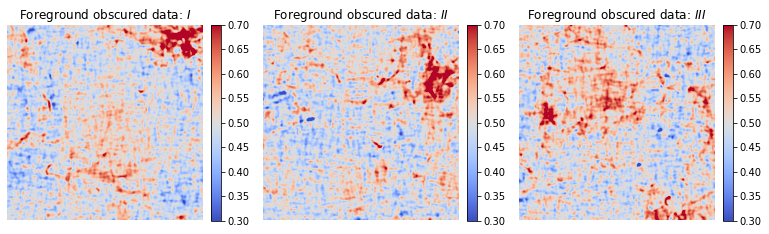

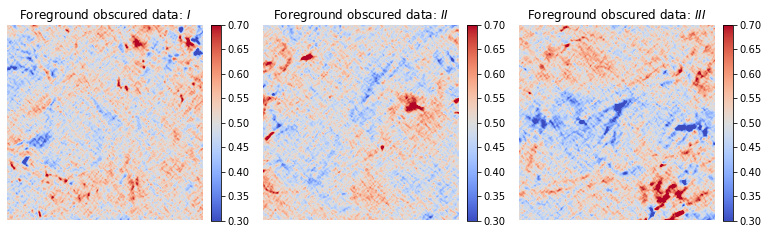

In [31]:
_ = plt.figure(figsize=(13,5))
_ = plt.subplot(1,3,1), plt.imshow(noisy_array[-n_test,:,:,0], clim=(0.3,0.7),
                                   interpolation='spline16', cmap = 'coolwarm')
_ = plt.title(r'Foreground obscured data: $I$'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.subplot(1,3,2), plt.imshow(noisy_array[-n_test+1,:,:,0], clim=(0.3,0.7),
                                   interpolation='spline16', cmap = 'coolwarm')
_ = plt.title(r'Foreground obscured data: $II$'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.subplot(1,3,3), plt.imshow(noisy_array[-n_test+2,:,:,0], clim=(0.3,0.7),
                                   interpolation='spline16',cmap = 'coolwarm')
_ = plt.title(r'Foreground obscured data: $III$'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.savefig('foreground_data_examples_Q1.png', dpi=300)

_ = plt.figure(figsize=(13,5))
_ = plt.subplot(1,3,1), plt.imshow(noisy_array[-n_test,:,:,1], clim=(0.3,0.7),
                                   interpolation='spline16', cmap = 'coolwarm')
_ = plt.title(r'Foreground obscured data: $I$'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.subplot(1,3,2), plt.imshow(noisy_array[-n_test+1,:,:,1], clim=(0.3,0.7),
                                   interpolation='spline16', cmap = 'coolwarm')
_ = plt.title(r'Foreground obscured data: $II$'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.subplot(1,3,3), plt.imshow(noisy_array[-n_test+2,:,:,1], clim=(0.3,0.7),
                                   interpolation='spline16',cmap = 'coolwarm')
_ = plt.title(r'Foreground obscured data: $III$'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.savefig('foreground_data_examples_U1.png', dpi=300)

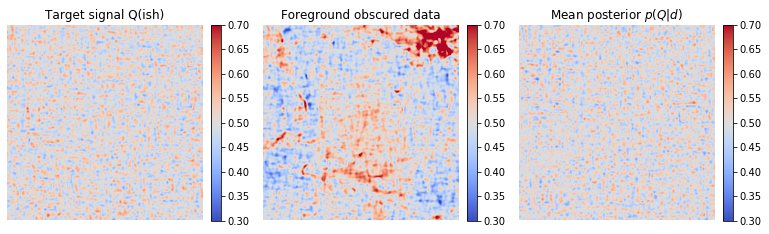

In [32]:
_ = plt.figure(figsize=(13,5))
_ = plt.subplot(1,3,1), plt.imshow(clean_array[-n_test,:,:,0], clim=(0.3,0.7),
                                   interpolation='spline16', cmap = 'coolwarm')
_ = plt.title('Target signal Q(ish)'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.subplot(1,3,2), plt.imshow(noisy_array[-n_test,:,:,0], clim=(0.3,0.7),
                                   interpolation='spline16', cmap = 'coolwarm')
_ = plt.title('Foreground obscured data'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.subplot(1,3,3), plt.imshow(test_output[0,:,:,0], clim=(0.3,0.7),
                                   interpolation='spline16',cmap = 'coolwarm')
_ = plt.title('Mean posterior $p(Q | d)$'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.savefig('reconstruction_pol_QU.png', dpi=300)

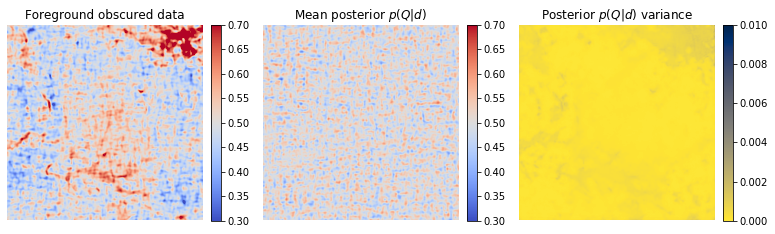

In [33]:
_ = plt.figure(figsize=(13,5))
_ = plt.subplot(1,3,1),  plt.imshow(noisy_array[-n_test,:,:,0], clim=(0.3,0.7),
                                   interpolation='spline16', cmap = 'coolwarm')
_ = plt.title('Foreground obscured data'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.subplot(1,3,2), plt.imshow(test_output[0,:,:,0], clim=(0.3,0.7),
                                   interpolation='spline16',cmap = 'coolwarm')
_ = plt.title('Mean posterior $p(Q | d)$'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.subplot(1,3,3), plt.imshow(test_var[0,:,:,0]/100., clim = (0.,1e-2),interpolation='spline16', cmap = 'cividis_r')
_ = plt.title('Posterior $p(Q | d)$ variance'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.savefig('reconstruction_var_pol_QU.png', dpi=300)

# Load examples

In [34]:
from astropy.io import fits

In [35]:
Q_alt = np.array(fits.open('../../polarized_synthesis/data/alternative/Q_y0_z_output_00071.fits')[0].data).astype(np.float32)
U_alt = np.array(fits.open('../../polarized_synthesis/data/alternative/U_y0_z_output_00071.fits')[0].data).astype(np.float32)

In [36]:
input_patch = np.stack([Q_alt, U_alt], axis=2)
input_patch = np.stack([input_patch[:256,:256],
                              input_patch[256:,:256],
                              input_patch[256:,256:],
                              input_patch[:256,256:]])

print(np.mean(Q_alt))

input_patch[:,:,:,0] = (input_patch[:,:,:,0] - np.mean(input_patch[:,:,:,0]))/(np.std(input_patch[:,:,:,0])*20.)
input_patch[:,:,:,1] = (input_patch[:,:,:,1] - np.mean(input_patch[:,:,:,1]))/(np.std(input_patch[:,:,:,1])*20.)
input_patch += 0.5

input_signal_example = np.reshape(test_array_clean[:4], (4,256,256,2))
input_patch_example = input_patch + input_signal_example - 0.5

0.009872015


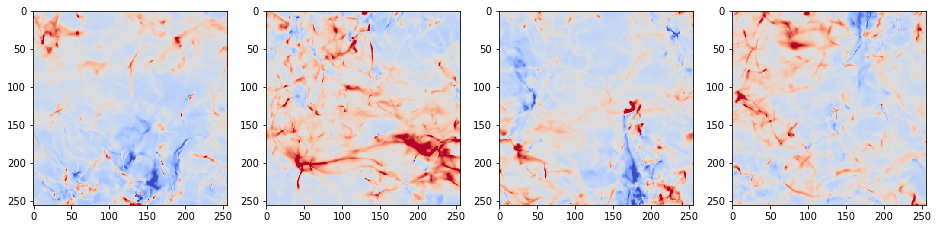

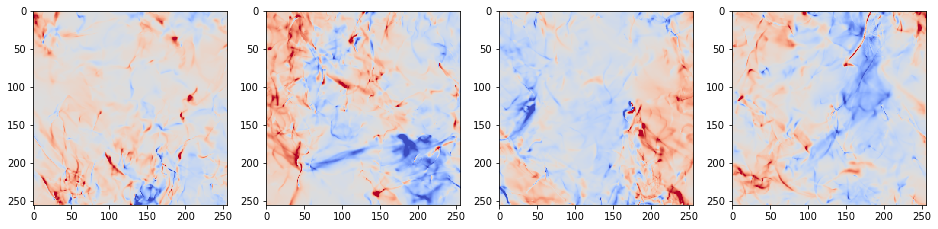

In [37]:
plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(input_patch[i,:,:,0], clim=(0.3,0.7))
plt.show()

plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(input_patch[i,:,:,1], clim=(0.3,0.7))
plt.show()

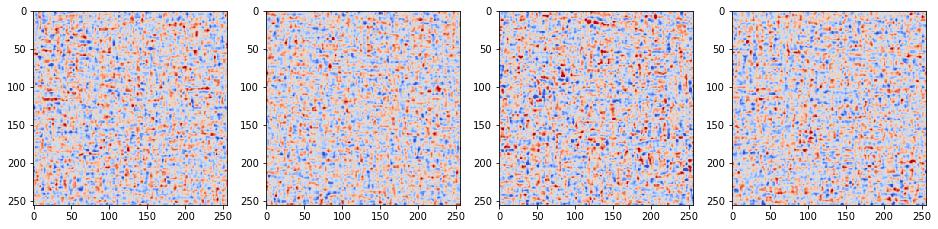

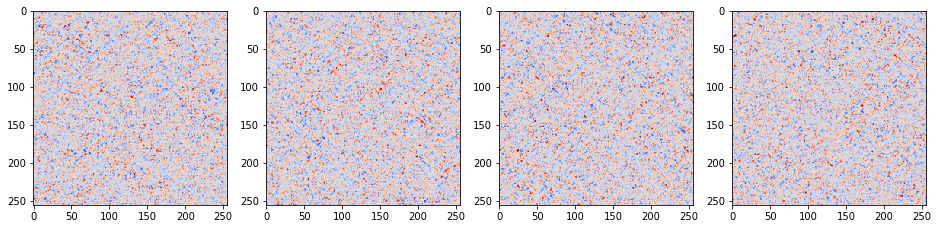

In [38]:
plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(input_signal_example[i,:,:,0], clim=(0.4,0.6))
plt.show()

plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(input_signal_example[i,:,:,1], clim=(0.4,0.6))
plt.show()

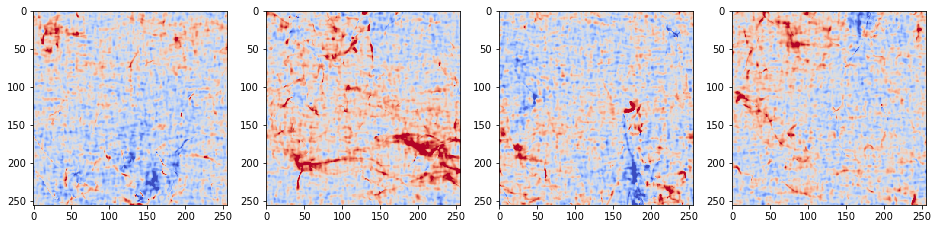

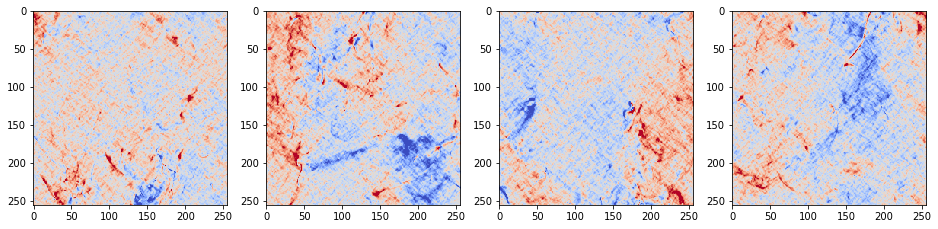

In [39]:
plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(input_patch_example[i,:,:,0], clim=(0.3,0.7))
plt.show()

plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(input_patch_example[i,:,:,1], clim=(0.3,0.7))
plt.show()

In [40]:
input_patch_example.shape

(4, 256, 256, 2)

In [41]:
valid_output = cnn_model.predict(input_patch_example[:,:,:,0].reshape(4,256,256,1))
valid_var = cnn_model_var.predict(input_patch_example[:,:,:,0].reshape(4,256,256,1))

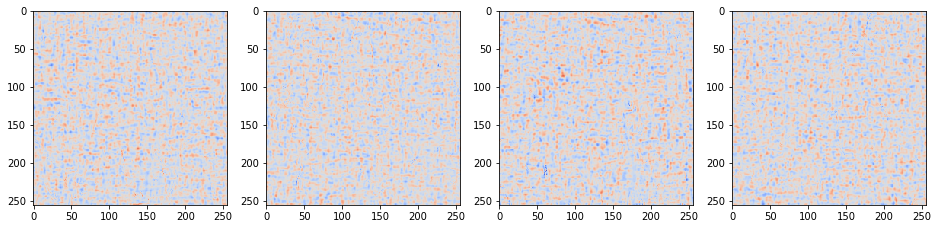

In [42]:
plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(valid_output[i,:,:,0], clim=(0.3,0.7))
plt.show()

In [43]:
residuals  = (valid_output[1,5:-5,5:-5,0] - input_signal_example[1,5:-5,5:-5,0]).flatten()
sigma = np.sqrt(valid_var[1,5:-5,5:-5,0]/100.).flatten()

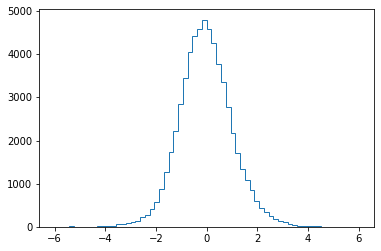

In [44]:
_ = plt.hist(residuals/sigma, bins=np.linspace(-6,6,65), histtype='step')

In [45]:
gaussian_samples = np.random.normal(0,1,int(1e7))

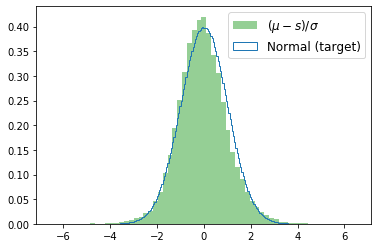

In [46]:
_ = plt.hist(residuals/sigma, bins=np.linspace(-6.5,6.5,64), color='C2', density=True, alpha=0.5,label=r'$(\mu - s)/\sigma$')
_ = plt.hist(gaussian_samples, bins=np.linspace(-6.5,6.5,256), histtype='step', density=True, label='Normal (target)')
_ = plt.legend(fontsize=12.), plt.savefig('validation_residuals_Q_1_1.png',dpi=100)